# Problem statement (Term Deposit Sale) 
Goal 
Using the collected from existing customers, build a model that will help the marketing team identify potential customers who are relatively more likely to subscribe term deposit and thus increase their hit ratio.  
Resources Available 
The historical data for this project is available in file 
https://archive.ics.uci.edu/ml/datasets/Bank+Marketing 
Deliverable – 1 (Exploratory data quality report reflecting the following) 1. Univariate analysis a. Univariate analysis – data types and description of the independent attributes which should include (name, meaning, range of values observed, central values (mean and median), standard deviation and quartiles, analysis of the body of distributions / tails, missing values, outliers. 
 
2. Multivariate analysis a. Bi-variate analysis between the predictor variables and target column. Comment on your findings in terms of their relationship and degree of relation if any. Presence of leverage points. Visualize the analysis using boxplots and pair plots, histograms or density curves. Select the most appropriate attributes.  
 
3. Strategies to address the different data challenges such as data pollution, outliers and missing values.  
Deliverable – 2 (Prepare the data for analytics) 1. Load the data into a data-frame. The data-frame should have data and column description. 2. Ensure the attribute types are correct. If not, take appropriate actions. 3. Transform the data i.e. scale / normalize if required 4. Create the training set and test set in ration of 70:30 
Deliverable – 3 (create the ensemble model) 1. Write python code using scikitlearn, pandas, numpy and others in Jupyter notebook to train and test the ensemble model. 2. First create a model using standard classification algorithm. Note the model performance. 3. Use appropriate algorithms and explain why that algorithm in the comment lines. 4. Evaluate the model. Use confusion matrix to evaluate class level metrics i.e..Precision and recall. Also reflect the overall score of the model. 5. Advantages and disadvantages of the algorithm. 6. Build the ensemble models and compare the results with the base model. Note: Random forest can be used only with Decision trees.  
Deliverable – 4 (Tuning the model) 1. Discuss some of the key hyper parameters available for the selected algorithm. What values did you initialize these parameters to? 2. Regularization techniques used for the model. 3. Range estimate at 95% confidence for the model performance in production.  
 
Attribute information 
Input variables: # bank client data: 1 - age (numeric) 2 - job : type of job (categorical: 'admin.','blue collar','entrepreneur','housemaid','management','retired','selfemployed','services','student','technician','unemployed','unknown') 3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed) 4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','u nknown') 5 - default: has credit in default? (categorical: 'no','yes','unknown') 6 - housing: has housing loan? (categorical: 'no','yes','unknown') 7 - loan: has personal loan? (categorical: 'no','yes','unknown') # related with the last contact of the current campaign: 8 - contact: contact communication type (categorical: 'cellular','telephone')  9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec') 10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri') 11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model. # other attributes: 12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact) 13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted) 14 - previous: number of contacts performed before this campaign and for this client (numeric) 15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success') # social and economic context attributes 16 - emp.var.rate: employment variation rate - quarterly indicator (numeric) 17 - cons.price.idx: consumer price index - monthly indicator (numeric)  18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)  19 - euribor3m: euribor 3 month rate - daily indicator (numeric) 
20 - nr.employed: number of employees - quarterly indicator (numeric) 
 
Output variable (desired target): 21 - y - has the client subscribed a term deposit? (binary: 'yes','no') 

In [1]:
# To enable plotting graphs in Jupyter notebook
%matplotlib inline 

In [2]:
import pandas as pd
from sklearn.linear_model import LogisticRegression

# importing ploting libraries
import matplotlib.pyplot as plt   

#importing seaborn for statistical plots
import seaborn as sns

#Let us break the X and y dataframes into training set and test set. For this we will use
#Sklearn package's data splitting function which is based on random function

from sklearn.model_selection import train_test_split

# This is used for numerical python
import numpy as np


# calculate accuracy measures and confusion matrix
from sklearn import metrics

In [3]:
# Reading the csv file and making a dataframe out of it using pandas
df=pd.read_csv("bank-full.csv")
bank_full_df=df

In [4]:
# watching the first few data and the type of data in the dataframe
bank_full_df.head().transpose()

,0,1,2,3,4
age,58,44,33,47,33
job,management,technician,entrepreneur,blue-collar,unknown
marital,married,single,married,married,single
education,tertiary,secondary,secondary,unknown,unknown
default,no,no,no,no,no
balance,2143,29,2,1506,1
housing,yes,yes,yes,yes,no
loan,no,no,yes,no,no
contact,unknown,unknown,unknown,unknown,unknown
day,5,5,5,5,5


# List of categorical variable columns
Marital
Job 
Contact 
Education
Month
Poutcome
Housing 
Loan
deposit
Default

# List of numerical variable columns
Age
Balance
Day
Duration
Campaign
Pdays
Previous

# Target variable column
Target


In [6]:
#size
bank_full_df.shape

(45211, 17)

In [7]:
#Info
bank_full_df.info() # The are some columns with datatype as object the same needs to be converted to numerical

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
age          45211 non-null int64
job          45211 non-null object
marital      45211 non-null object
education    45211 non-null object
default      45211 non-null object
balance      45211 non-null int64
housing      45211 non-null object
loan         45211 non-null object
contact      45211 non-null object
day          45211 non-null int64
month        45211 non-null object
duration     45211 non-null int64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null object
Target       45211 non-null object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [8]:
#Describe
bank_full_df.describe().transpose() # Use for statistical analysis to study for potential outliers

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


In [9]:
#Checking for null value
bank_full_df.isnull().sum() # Based on the observation no null values are present

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
Target       0
dtype: int64

In [10]:
#Removing columns which are irrelevant and/or impacting the target column which is not required
bank_full_df = bank_full_df.drop(['day'],axis=1) # removing the day column
bank_full_df.Target.replace(('yes','no'),(1,0),inplace=True) # converting the target column to binary 0 and 1

In [60]:
# Note for target column '0' is for non-defaulters(no value) i.e clients who do not subscribe a term deposit and 1 stands for defaulters(yes value) i.e client who subscribe a term deposit.

In [11]:
# Decision tree in Python can take only numerical / categorical colums. It cannot take string / obeject types. 
# The following code loops through each column and checks if the column type is object then converts those columns
# into categorical with each distinct value becoming a category or code.

for feature in bank_full_df.columns: # Loop through all columns in the dataframe
    if bank_full_df[feature].dtype == 'object': # Only apply for columns with categorical strings
        bank_full_df[feature] = pd.Categorical(bank_full_df[feature]).codes # Replace strings with an integer

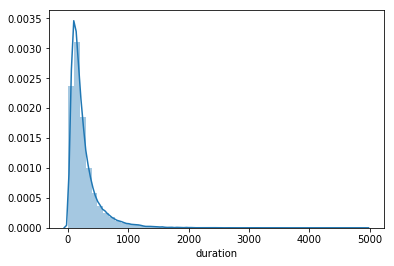

In [12]:
sns.distplot(bank_full_df['duration']) 

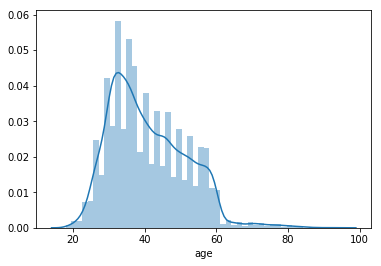

In [13]:
sns.distplot(bank_full_df['age'])

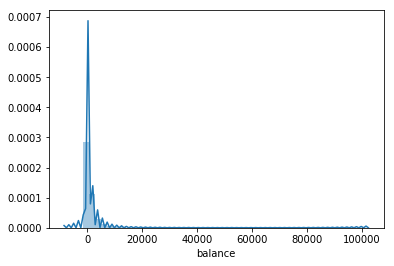

In [14]:
sns.distplot(bank_full_df['balance'])

In [15]:
#Above, All the Histogram suggest that data is skewed towards left i.e. existence of skewness brings us to a point that we need to sample the data efficiently while classifiying the train_data and test_data !

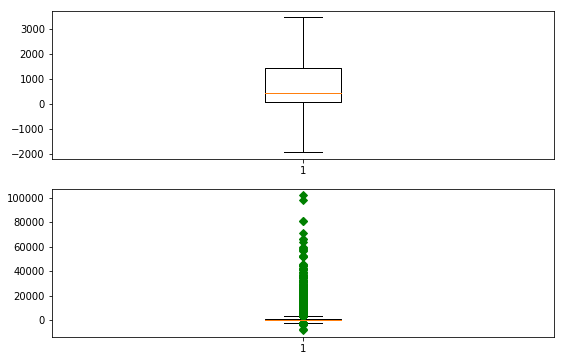

In [16]:
fig = plt.figure(1, figsize=(9, 6))
ax1 = fig.add_subplot(211)
bp1 = ax1.boxplot(bank_full_df.balance,0,'')
ax2 = fig.add_subplot(212)
bp2 = ax2.boxplot(bank_full_df.balance,0,'gD')
plt.show()

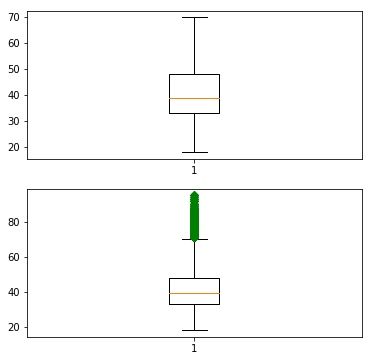

In [17]:
fig = plt.figure(1, figsize=(6, 6))
ax = fig.add_subplot(211)
bp = ax.boxplot(bank_full_df.age,0,'')
ax = fig.add_subplot(212)
bp = ax.boxplot(bank_full_df.age,0,'gD')
plt.show()

fig = plt.figure(1, figsize=(9, 6))
ax1 = fig.add_subplot(211)
bp1 = ax1.boxplot(bank_full_df.duration,0,'')
ax2 = fig.add_subplot(212)
bp2 = ax2.boxplot(bank_full_df.duration,0,'gD')
plt.show()

In [18]:
#Above boxplot suggest how the data is spread across the dataset Most of the data is lying above the 3rd quantile by multiplication factor of 1.5 i.e. by theortical aspect the data points are outlier for most of the data points.

In [19]:
data = bank_full_df

print(data.columns)

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'month', 'duration', 'campaign', 'pdays', 'previous',
       'poutcome', 'Target'],
      dtype='object')


In [20]:
data.head() # Observing the dataframe created by converting the categorical data to numeric

,age,job,marital,education,default,balance,housing,loan,contact,month,duration,campaign,pdays,previous,poutcome,Target
0,58,4,1,2,0,2143,1,0,2,8,261,1,-1,0,3,0
1,44,9,2,1,0,29,1,0,2,8,151,1,-1,0,3,0
2,33,2,1,1,0,2,1,1,2,8,76,1,-1,0,3,0
3,47,1,1,3,0,1506,1,0,2,8,92,1,-1,0,3,0
4,33,11,2,3,0,1,0,0,2,8,198,1,-1,0,3,0


In [21]:
data.shape 


(45211, 16)

In [22]:
data.info() # So its clear that all the columns in the dataframe are now numeric

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 16 columns):
age          45211 non-null int64
job          45211 non-null int8
marital      45211 non-null int8
education    45211 non-null int8
default      45211 non-null int8
balance      45211 non-null int64
housing      45211 non-null int8
loan         45211 non-null int8
contact      45211 non-null int8
month        45211 non-null int8
duration     45211 non-null int64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null int8
Target       45211 non-null int64
dtypes: int64(7), int8(9)
memory usage: 2.8 MB


In [23]:
data.describe().transpose() 

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
job,45211.0,4.339762,3.272657,0.0,1.0,4.0,7.0,11.0
marital,45211.0,1.167725,0.608230,0.0,1.0,1.0,2.0,2.0
education,45211.0,1.224813,0.747997,0.0,1.0,1.0,2.0,3.0
default,45211.0,0.018027,0.133049,0.0,0.0,0.0,0.0,1.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
housing,45211.0,0.555838,0.496878,0.0,0.0,1.0,1.0,1.0
loan,45211.0,0.160226,0.366820,0.0,0.0,0.0,0.0,1.0
contact,45211.0,0.640242,0.897951,0.0,0.0,0.0,2.0,2.0
month,45211.0,5.523014,3.006911,0.0,3.0,6.0,8.0,11.0


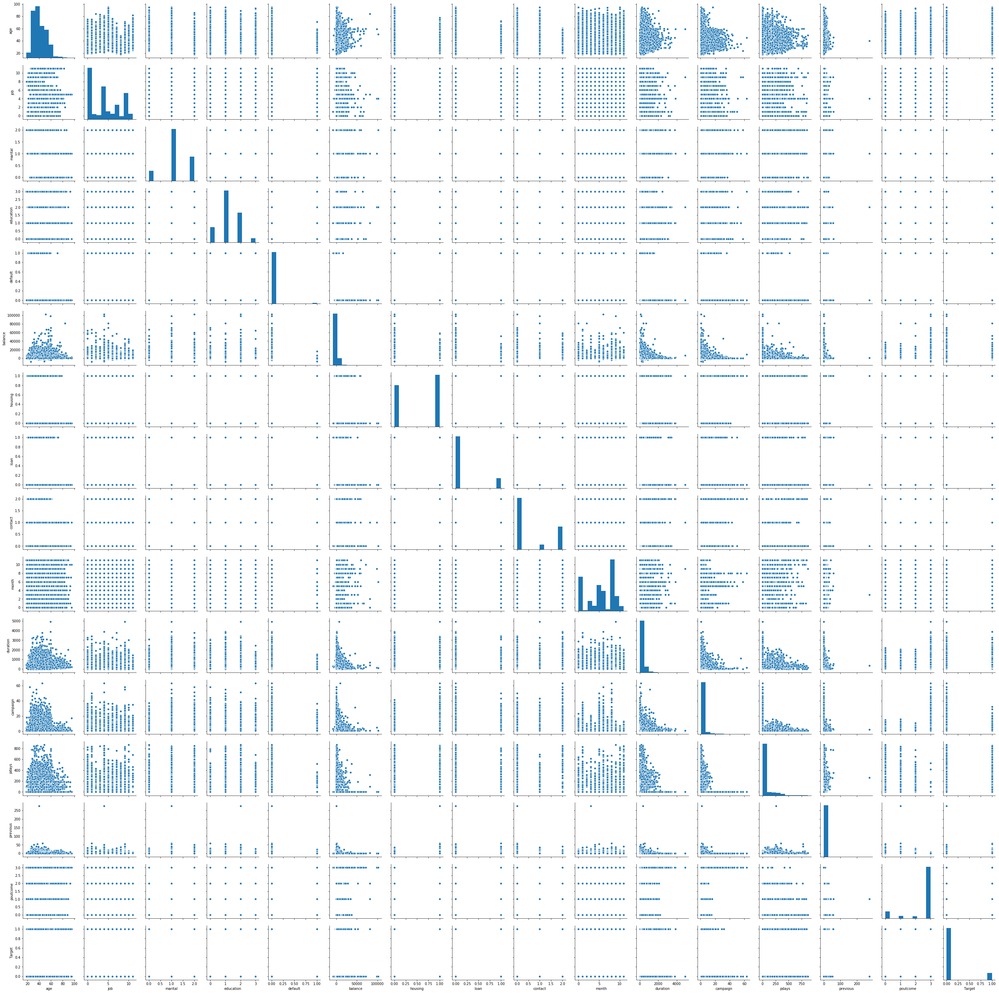

In [24]:
sns.pairplot(data) # Examining the nature to the data distributed and the impact of attributes(independent variables) over the classes(target variable) and among each other

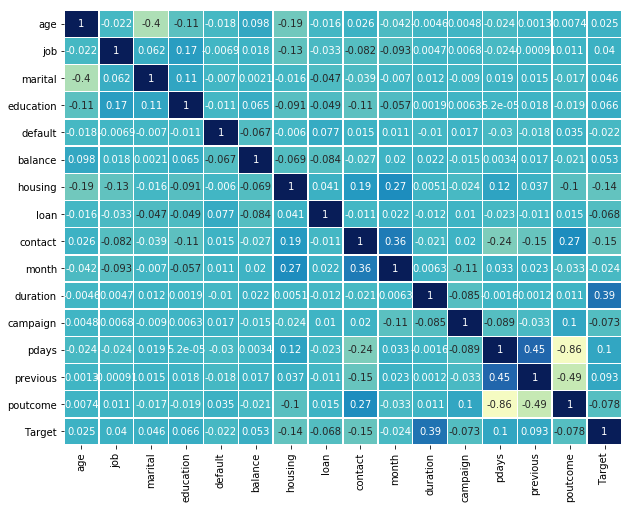

In [25]:

plt.figure(figsize=(10,8))
sns.heatmap(data.corr(),
            annot=True,
            linewidths=.5,
            center=0,
            cbar=False,
            cmap="YlGnBu")
plt.show()

In [26]:
#Breaking the dataset into two parts, X denotes the independent variables or features, y denotes the target variable
X = data.drop("Target", axis=1)
y = data.pop("Target")

In [27]:
print(X.shape , y.shape)


(45211, 15) (45211,)


In [28]:
test_size = 0.30 # taking 70:30 training and test set

In [29]:
iterationList=np.random.randint(1,100,10) # this list contains 10 random numbers between 1 to 100 the same will be used in random state in various iterations in different models


# Trying to find out the best fit model

# Naive Bayes

In [30]:
from sklearn import model_selection
from sklearn.naive_bayes import GaussianNB

In [31]:
model = GaussianNB()

itr = 1
for i in iterationList:
    seed = i
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size,random_state=seed)  
    # Fitting the mode
    model.fit(X_train, y_train)
    #Prediction on test set
    prediction = model.predict(X_test)
    # Accuracy on test set
    accuracy =  model.score(X_test, y_test)
    expected=y_test
    print("Iteration ",itr)
    itr=itr+1
    print()
    print("data split random state ",seed)
    print("Classification report")
    print(metrics.classification_report(expected, prediction))
    print("Confusion matrix")
    print(metrics.confusion_matrix(expected, prediction))
    print("Overall score ",accuracy)
    print("----------------------------------------------------")

Iteration  1

data split random state  52
Classification report
              precision    recall  f1-score   support

           0       0.93      0.90      0.91     11974
           1       0.38      0.46      0.42      1590

   micro avg       0.85      0.85      0.85     13564
   macro avg       0.65      0.68      0.66     13564
weighted avg       0.86      0.85      0.86     13564

Confusion matrix
[[10784  1190]
 [  859   731]]
Overall score  0.848938366263639
----------------------------------------------------
Iteration  2

data split random state  16
Classification report
              precision    recall  f1-score   support

           0       0.92      0.90      0.91     11918
           1       0.36      0.43      0.39      1646

   micro avg       0.84      0.84      0.84     13564
   macro avg       0.64      0.66      0.65     13564
weighted avg       0.85      0.84      0.84     13564

Confusion matrix
[[10668  1250]
 [  938   708]]
Overall score  0.8386906517251548
--

In [59]:
# From the Naive Bayes study we get to see that the highest overall score is 85% , however the recall value for the defaulters is only 46% showing lack of data for the dafaulters. 

# Support Vector Machine

In [33]:
# Importing SVC
from sklearn.svm import SVC

In [34]:
# Building the model with Kernel = 'linear'

In [35]:
# Building a Support Vector Machine on train data
svc_model = SVC(C= .1, kernel='rbf', gamma= 1)
# gamma is a measure of influence of a data point. It is inverse of distance of influence. C is complexity of the model
# lower C value creates simple hyper surface while higher C creates complex surface
seed =1 # Random numbmer seeding for reapeatability of the code
test_size = 0.30 # taking 70:30 training and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size,random_state=seed)

# Fitting the mode
svc_model.fit(X_train, y_train)

#Prediction on test set
prediction = svc_model.predict(X_test)

# Accuracy on test set
accuracy =  svc_model.score(X_test, y_test)
expected=y_test
print("Classification report")
print(metrics.classification_report(expected, prediction))
print("Confusion matrix")
print(metrics.confusion_matrix(expected, prediction))
print("Overall score ",accuracy)

Classification report
              precision    recall  f1-score   support

           0       0.89      1.00      0.94     12013
           1       0.00      0.00      0.00      1551

   micro avg       0.89      0.89      0.89     13564
   macro avg       0.44      0.50      0.47     13564
weighted avg       0.78      0.89      0.83     13564

Confusion matrix
[[12013     0]
 [ 1551     0]]
Overall score  0.8856531996461221


C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [65]:
# Unfortunately SVM with kernel as rbf took a long time to execute and we do not get much from this model. The SVM model only predicts for the non defaulters 

# KNN

In [36]:
# importing necessary libraries
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import zscore

In [37]:
# convert the features into z scores as we do not know what units / scales were used and store them in new dataframe
# It is always adviced to scale numeric attributes in models that calculate distances.

df_z = data.apply(zscore)  # converting all attributes to Z scale 

df_z.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,45211.0,5.222844e-16,1.000011,-2.159994,-0.747384,-0.182341,0.665225,5.091402
job,45211.0,1.560056e-14,1.000011,-1.326082,-1.020516,-0.103820,0.812877,2.035139
marital,45211.0,4.638734e-15,1.000011,-1.919895,-0.275762,-0.275762,1.368372,1.368372
education,45211.0,-2.928306e-14,1.000011,-1.637474,-0.300556,-0.300556,1.036362,2.373280
default,45211.0,4.520540e-15,1.000011,-0.135490,-0.135490,-0.135490,-0.135490,7.380625
balance,45211.0,3.070663e-15,1.000011,-3.081149,-0.423772,-0.300280,0.021587,33.094776
housing,45211.0,1.382298e-14,1.000011,-1.118674,-1.118674,0.893915,0.893915,0.893915
loan,45211.0,-1.275129e-14,1.000011,-0.436803,-0.436803,-0.436803,-0.436803,2.289359
contact,45211.0,3.943212e-14,1.000011,-0.713012,-0.713012,-0.713012,1.514306,1.514306
month,45211.0,5.036415e-14,1.000011,-1.836794,-0.839081,0.158632,0.823773,1.821486


In [38]:
X_z = df_z #Fetching all featues/independent columns from z-score dataframe df_z

In [39]:
itr=1
# choosing k value as 3 and assigning weight values based on the distance
NNH = KNeighborsClassifier(n_neighbors= 3 , weights = 'distance' )
for i in iterationList:  
    seed = i
    X_train, X_test, y_train, y_test = train_test_split(X_z, y, test_size=test_size,random_state=seed)
    # Fitting the mode
    NNH.fit(X_train, y_train)
    #Prediction on test set
    prediction = NNH.predict(X_test)
    # Accuracy on test set
    accuracy =  NNH.score(X_test, y_test)
    expected=y_test
    print("Iteration ",itr)
    itr=itr+1
    print()
    print("data split random state ",seed)
    print("Classification report")
    print(metrics.classification_report(expected, prediction))
    print("Confusion matrix")
    print(metrics.confusion_matrix(expected, prediction))
    print("Overall score ",accuracy)
    print("----------------------------------------------------")

Iteration  1

data split random state  52
Classification report
              precision    recall  f1-score   support

           0       0.92      0.96      0.94     11974
           1       0.52      0.35      0.42      1590

   micro avg       0.89      0.89      0.89     13564
   macro avg       0.72      0.65      0.68     13564
weighted avg       0.87      0.89      0.88     13564

Confusion matrix
[[11469   505]
 [ 1039   551]]
Overall score  0.8861692716012975
----------------------------------------------------
Iteration  2

data split random state  16
Classification report
              precision    recall  f1-score   support

           0       0.92      0.96      0.94     11918
           1       0.54      0.38      0.44      1646

   micro avg       0.89      0.89      0.89     13564
   macro avg       0.73      0.67      0.69     13564
weighted avg       0.87      0.89      0.88     13564

Confusion matrix
[[11383   535]
 [ 1023   623]]
Overall score  0.8851371276909467
-

In [40]:
itr=1
# choosing k value as 7 and assigning weight values based on the distance
NNH = KNeighborsClassifier(n_neighbors= 7 , weights = 'distance' )
for i in iterationList:  
    seed = i
    X_train, X_test, y_train, y_test = train_test_split(X_z, y, test_size=test_size,random_state=seed)
    # Fitting the mode
    NNH.fit(X_train, y_train)
    #Prediction on test set
    prediction = NNH.predict(X_test)
    # Accuracy on test set
    accuracy =  NNH.score(X_test, y_test)
    expected=y_test
    print("Iteration ",itr)
    itr=itr+1
    print()
    print("data split random state ",seed)
    print("Classification report")
    print(metrics.classification_report(expected, prediction))
    print("Confusion matrix")
    print(metrics.confusion_matrix(expected, prediction))
    print("Overall score ",accuracy)
    print("----------------------------------------------------")

Iteration  1

data split random state  52
Classification report
              precision    recall  f1-score   support

           0       0.92      0.97      0.94     11974
           1       0.58      0.32      0.41      1590

   micro avg       0.89      0.89      0.89     13564
   macro avg       0.75      0.65      0.68     13564
weighted avg       0.88      0.89      0.88     13564

Confusion matrix
[[11605   369]
 [ 1078   512]]
Overall score  0.893320554408729
----------------------------------------------------
Iteration  2

data split random state  16
Classification report
              precision    recall  f1-score   support

           0       0.91      0.97      0.94     11918
           1       0.60      0.33      0.43      1646

   micro avg       0.89      0.89      0.89     13564
   macro avg       0.76      0.65      0.68     13564
weighted avg       0.88      0.89      0.88     13564

Confusion matrix
[[11563   355]
 [ 1105   541]]
Overall score  0.8923621350634031
--

In [66]:
# From both the KNN analysis for n-neighbours 3 and 7 respectively we find relatively good result for n-neighbours as 3. The best result obtained is in iteration 2 with overall accuracy of 88% but again the recall for dafaulters is low due to lack of data.

# Decision Tree

In [41]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_extraction.text import CountVectorizer  #DT does not take strings as input for the model fit step....

In [42]:
test_size = 0.30 # taking 70:30 training and test set

# Calculating information gain using gini

In [44]:
iterationList = np.random.randint(1,100,5) # Creting a list of 5 random variables between 1 and 100 the same will be used in different iterations for random state

In [45]:
itr=1;
for i in iterationList:
    
    treeseed = i
    dt_model = DecisionTreeClassifier(criterion = 'gini' , random_state=treeseed )
    
    for j in iterationList:
        seed=j
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)
        dt_model.fit(X_train, y_train)
         #Prediction on test set
        prediction = dt_model.predict(X_test)
        # Accuracy on test set
        accuracy =  dt_model.score(X_test, y_test)
        expected=y_test
        print("Iteration ",itr)
        itr=itr+1
        print()
        print("Decision tree criterion gini random state ",treeseed)
        print("data split random state ",seed)
        print("Classification report")
        print(metrics.classification_report(expected, prediction))
        print("Confusion matrix")
        print(metrics.confusion_matrix(expected, prediction))
        print("Overall score ",accuracy)
        print("----------------------------------------------------")

Iteration  1

Decision tree criterion gini random state  41
data split random state  41
Classification report
              precision    recall  f1-score   support

           0       0.93      0.92      0.93     11936
           1       0.46      0.48      0.47      1628

   micro avg       0.87      0.87      0.87     13564
   macro avg       0.69      0.70      0.70     13564
weighted avg       0.87      0.87      0.87     13564

Confusion matrix
[[11026   910]
 [  849   779]]
Overall score  0.8703184901209083
----------------------------------------------------
Iteration  2

Decision tree criterion gini random state  41
data split random state  14
Classification report
              precision    recall  f1-score   support

           0       0.93      0.92      0.92     11949
           1       0.44      0.46      0.45      1615

   micro avg       0.87      0.87      0.87     13564
   macro avg       0.68      0.69      0.69     13564
weighted avg       0.87      0.87      0.87   

Iteration  17

Decision tree criterion gini random state  25
data split random state  14
Classification report
              precision    recall  f1-score   support

           0       0.93      0.92      0.92     11949
           1       0.44      0.45      0.45      1615

   micro avg       0.87      0.87      0.87     13564
   macro avg       0.68      0.69      0.68     13564
weighted avg       0.87      0.87      0.87     13564

Confusion matrix
[[11022   927]
 [  887   728]]
Overall score  0.8662636390445296
----------------------------------------------------
Iteration  18

Decision tree criterion gini random state  25
data split random state  3
Classification report
              precision    recall  f1-score   support

           0       0.93      0.93      0.93     11969
           1       0.46      0.46      0.46      1595

   micro avg       0.87      0.87      0.87     13564
   macro avg       0.70      0.70      0.70     13564
weighted avg       0.87      0.87      0.87  

# Calculating information gain using entropy

In [47]:
itr=1;
for i in iterationList:
    
    treeseed = i
    dt_model = DecisionTreeClassifier(criterion = 'entropy' , random_state=treeseed )
    
    for j in iterationList:
        seed=j
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)
        dt_model.fit(X_train, y_train)
         #Prediction on test set
        prediction = dt_model.predict(X_test)
        # Accuracy on test set
        accuracy =  dt_model.score(X_test, y_test)
        expected=y_test
        print("Iteration ",itr)
        itr=itr+1
        print()
        print("Decision tree criterion entropy random state ",treeseed)
        print("data split random state ",seed)
        print("Classification report")
        print(metrics.classification_report(expected, prediction))
        print("Confusion matrix")
        print(metrics.confusion_matrix(expected, prediction))
        print("Overall score ",accuracy)
        print("----------------------------------------------------")

Iteration  1

Decision tree criterion entropy random state  41
data split random state  41
Classification report
              precision    recall  f1-score   support

           0       0.92      0.92      0.92     11936
           1       0.44      0.44      0.44      1628

   micro avg       0.87      0.87      0.87     13564
   macro avg       0.68      0.68      0.68     13564
weighted avg       0.87      0.87      0.87     13564

Confusion matrix
[[11029   907]
 [  905   723]]
Overall score  0.8664110881745798
----------------------------------------------------
Iteration  2

Decision tree criterion entropy random state  41
data split random state  14
Classification report
              precision    recall  f1-score   support

           0       0.93      0.93      0.93     11949
           1       0.45      0.45      0.45      1615

   micro avg       0.87      0.87      0.87     13564
   macro avg       0.69      0.69      0.69     13564
weighted avg       0.87      0.87      0

Iteration  17

Decision tree criterion entropy random state  25
data split random state  14
Classification report
              precision    recall  f1-score   support

           0       0.92      0.93      0.93     11949
           1       0.44      0.43      0.44      1615

   micro avg       0.87      0.87      0.87     13564
   macro avg       0.68      0.68      0.68     13564
weighted avg       0.87      0.87      0.87     13564

Confusion matrix
[[11070   879]
 [  913   702]]
Overall score  0.867885579475081
----------------------------------------------------
Iteration  18

Decision tree criterion entropy random state  25
data split random state  3
Classification report
              precision    recall  f1-score   support

           0       0.93      0.93      0.93     11969
           1       0.46      0.46      0.46      1595

   micro avg       0.87      0.87      0.87     13564
   macro avg       0.69      0.69      0.69     13564
weighted avg       0.87      0.87      0

In [61]:
# The results obtained from Gini and Entropy are almost similar, we get highest overall accuracy of 88 % but again the recall value for defaulters is less to 49 % due to non availibility of data for defaulters

# Visualizing the full blown decison tree

In [48]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

In [49]:
train_char_label = ['No', 'Yes']
xvar = data
feature_cols = xvar.columns

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.288241 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.288241 to fit



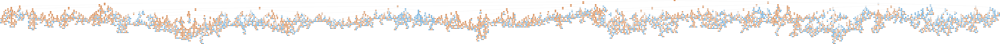

In [50]:
dot_data = StringIO()
export_graphviz(dt_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=list(train_char_label))
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('bank_full_tree.png')
Image(graph.create_png())

# Regularising the Decision Tree

In [51]:
md =10 # Considering a max-depth of 10 , i.e maximum 10 levels of splitting are allowed

itr=1
for i in iterationList:
    treeseed = i
    clf_pruned = DecisionTreeClassifier(criterion = 'entropy', max_depth =md, random_state=treeseed)
    md=md+1
    
    for j in iterationList:
        seed=j
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)
        clf_pruned.fit(X_train, y_train)
        #Prediction on test set
        prediction = clf_pruned.predict(X_test)
        # Accuracy on test set
        accuracy =  clf_pruned.score(X_test, y_test)
        expected=y_test
        print("Iteration ",itr)
        itr=itr+1
        print()
        print("Regularised Decision tree criterion entropy random state ",treeseed)
        print("Max depth ",md)
        print("data split random state ",seed)
        print("Classification report")
        print(metrics.classification_report(expected, prediction))
        print("Confusion matrix")
        print(metrics.confusion_matrix(expected, prediction))
        print("Overall score ",accuracy)
        print("----------------------------------------------------")

Iteration  1

Regularised Decision tree criterion entropy random state  41
Max depth  11
data split random state  41
Classification report
              precision    recall  f1-score   support

           0       0.92      0.95      0.94     11936
           1       0.56      0.43      0.48      1628

   micro avg       0.89      0.89      0.89     13564
   macro avg       0.74      0.69      0.71     13564
weighted avg       0.88      0.89      0.88     13564

Confusion matrix
[[11398   538]
 [  935   693]]
Overall score  0.8914037157180773
----------------------------------------------------
Iteration  2

Regularised Decision tree criterion entropy random state  41
Max depth  11
data split random state  14
Classification report
              precision    recall  f1-score   support

           0       0.93      0.96      0.94     11949
           1       0.59      0.44      0.50      1615

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.76      0.70      0.7

Iteration  15

Regularised Decision tree criterion entropy random state  3
Max depth  13
data split random state  10
Classification report
              precision    recall  f1-score   support

           0       0.93      0.96      0.94     12006
           1       0.57      0.43      0.49      1558

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.75      0.69      0.72     13564
weighted avg       0.89      0.90      0.89     13564

Confusion matrix
[[11507   499]
 [  891   667]]
Overall score  0.8975228546151578
----------------------------------------------------
Iteration  16

Regularised Decision tree criterion entropy random state  25
Max depth  14
data split random state  41
Classification report
              precision    recall  f1-score   support

           0       0.92      0.95      0.94     11936
           1       0.53      0.42      0.47      1628

   micro avg       0.89      0.89      0.89     13564
   macro avg       0.73      0.69      0.

In [64]:
# Here we get slightly better result compared to the full blown decision tree thus we conclude that the full tree is overfitted

# Visualizing the regularized decision tree

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.361415 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.361415 to fit



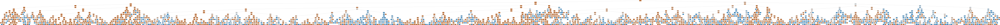

In [52]:
dot_data = StringIO()
export_graphviz(clf_pruned, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=list(train_char_label))
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('bank_regularized_tree.png')
Image(graph.create_png())

#                             Ensemble Learning - Bagging

In [53]:
from sklearn.ensemble import BaggingClassifier
itr=1
for i in iterationList:
    treeseed = i
    bgcl = BaggingClassifier(base_estimator=dt_model, n_estimators=100, random_state=treeseed)
    
    for j in iterationList:
        seed=j
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)
        bgcl = bgcl.fit(X_train, y_train)
        #Prediction on test set
        prediction = bgcl.predict(X_test)
        # Accuracy on test set
        accuracy =  bgcl.score(X_test, y_test)
        expected=y_test
        print("Iteration ",itr)
        itr=itr+1
        print()
        print("Bagging random state ",treeseed)
        print("data split random state ",seed)
        print("Classification report")
        print(metrics.classification_report(expected, prediction))
        print("Confusion matrix")
        print(metrics.confusion_matrix(expected, prediction))
        print("Overall score ",accuracy)
        print("----------------------------------------------------")

Iteration  1

Bagging random state  41
data split random state  41
Classification report
              precision    recall  f1-score   support

           0       0.93      0.96      0.94     11936
           1       0.60      0.45      0.51      1628

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.76      0.70      0.73     13564
weighted avg       0.89      0.90      0.89     13564

Confusion matrix
[[11448   488]
 [  898   730]]
Overall score  0.897817752875258
----------------------------------------------------
Iteration  2

Bagging random state  41
data split random state  14
Classification report
              precision    recall  f1-score   support

           0       0.93      0.96      0.95     11949
           1       0.63      0.46      0.53      1615

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.78      0.71      0.74     13564
weighted avg       0.89      0.90      0.90     13564

Confusion matrix
[[11513   436]
 [

Iteration  16

Bagging random state  25
data split random state  41
Classification report
              precision    recall  f1-score   support

           0       0.93      0.96      0.94     11936
           1       0.59      0.45      0.51      1628

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.76      0.70      0.73     13564
weighted avg       0.89      0.90      0.89     13564

Confusion matrix
[[11439   497]
 [  899   729]]
Overall score  0.8970805072250073
----------------------------------------------------
Iteration  17

Bagging random state  25
data split random state  14
Classification report
              precision    recall  f1-score   support

           0       0.93      0.96      0.95     11949
           1       0.63      0.44      0.52      1615

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.78      0.70      0.73     13564
weighted avg       0.89      0.90      0.90     13564

Confusion matrix
[[11525   424]

In [67]:
# For Bagging we get highest accuracy of 90% with a recall for defaulters as 47% showing the dominance nature of the non defaulters.

# Ensemble Learning - AdaBoosting

In [54]:
from sklearn.ensemble import AdaBoostClassifier
itr=1
for i in iterationList:
    treeseed = i
    abcl = AdaBoostClassifier(base_estimator=dt_model, n_estimators=100, random_state=treeseed)
    
    for j in iterationList:
        seed=j
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)
        abcl = abcl.fit(X_train, y_train)
        #Prediction on test set
        prediction = abcl.predict(X_test)
        # Accuracy on test set
        accuracy =  abcl.score(X_test, y_test)
        expected=y_test
        print("Iteration ",itr)
        itr=itr+1
        print()
        print("AdaBoosting random state ",treeseed)
        print("data split random state ",seed)
        print("Classification report")
        print(metrics.classification_report(expected, prediction))
        print("Confusion matrix")
        print(metrics.confusion_matrix(expected, prediction))
        print("Overall score ",accuracy)
        print("----------------------------------------------------")

Iteration  1

AdaBoosting random state  41
data split random state  41
Classification report
              precision    recall  f1-score   support

           0       0.93      0.92      0.92     11936
           1       0.44      0.45      0.45      1628

   micro avg       0.87      0.87      0.87     13564
   macro avg       0.68      0.69      0.69     13564
weighted avg       0.87      0.87      0.87     13564

Confusion matrix
[[11012   924]
 [  892   736]]
Overall score  0.8661161899144795
----------------------------------------------------
Iteration  2

AdaBoosting random state  41
data split random state  14
Classification report
              precision    recall  f1-score   support

           0       0.92      0.93      0.93     11949
           1       0.45      0.44      0.45      1615

   micro avg       0.87      0.87      0.87     13564
   macro avg       0.69      0.68      0.69     13564
weighted avg       0.87      0.87      0.87     13564

Confusion matrix
[[11060 

[[10998   938]
 [  889   739]]
Overall score  0.8653052196992038
----------------------------------------------------
Iteration  17

AdaBoosting random state  25
data split random state  14
Classification report
              precision    recall  f1-score   support

           0       0.93      0.93      0.93     11949
           1       0.45      0.45      0.45      1615

   micro avg       0.87      0.87      0.87     13564
   macro avg       0.69      0.69      0.69     13564
weighted avg       0.87      0.87      0.87     13564

Confusion matrix
[[11076   873]
 [  890   725]]
Overall score  0.870023591860808
----------------------------------------------------
Iteration  18

AdaBoosting random state  25
data split random state  3
Classification report
              precision    recall  f1-score   support

           0       0.93      0.93      0.93     11969
           1       0.46      0.46      0.46      1595

   micro avg       0.87      0.87      0.87     13564
   macro avg    

#                     Ensemble Learning - GradientBoost

In [57]:
from sklearn.ensemble import GradientBoostingClassifier
itr=1
for i in iterationList:
    treeseed = i
    gbcl = GradientBoostingClassifier(n_estimators = 100, random_state=treeseed)
    for j in iterationList:
        seed=j
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)
        gbcl = gbcl.fit(X_train, y_train)
        #Prediction on test set
        prediction = gbcl.predict(X_test)
        # Accuracy on test set
        accuracy =  gbcl.score(X_test, y_test)
        expected=y_test
        print("Iteration ",itr)
        itr=itr+1
        print()
        print("GradientBoosting random state ",treeseed)
        print("data split random state ",seed)
        print("Classification report")
        print(metrics.classification_report(expected, prediction))
        print("Confusion matrix")
        print(metrics.confusion_matrix(expected, prediction))
        print("Overall score ",accuracy)
        print("----------------------------------------------------")

Iteration  1

GradientBoosting random state  41
data split random state  41
Classification report
              precision    recall  f1-score   support

           0       0.92      0.97      0.95     11936
           1       0.64      0.38      0.48      1628

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.78      0.68      0.71     13564
weighted avg       0.89      0.90      0.89     13564

Confusion matrix
[[11592   344]
 [ 1005   623]]
Overall score  0.9005455617811855
----------------------------------------------------
Iteration  2

GradientBoosting random state  41
data split random state  14
Classification report
              precision    recall  f1-score   support

           0       0.92      0.97      0.95     11949
           1       0.65      0.40      0.49      1615

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.79      0.68      0.72     13564
weighted avg       0.89      0.90      0.89     13564

Confusion matri

Iteration  16

GradientBoosting random state  25
data split random state  41
Classification report
              precision    recall  f1-score   support

           0       0.92      0.97      0.95     11936
           1       0.64      0.38      0.48      1628

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.78      0.68      0.71     13564
weighted avg       0.89      0.90      0.89     13564

Confusion matrix
[[11592   344]
 [ 1005   623]]
Overall score  0.9005455617811855
----------------------------------------------------
Iteration  17

GradientBoosting random state  25
data split random state  14
Classification report
              precision    recall  f1-score   support

           0       0.92      0.97      0.95     11949
           1       0.65      0.40      0.49      1615

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.79      0.68      0.72     13564
weighted avg       0.89      0.90      0.89     13564

Confusion mat

In [63]:
# In this case we get better result for AdaBoosting that Gradient Boosting mechanism. Although the highest accuracy in Gradient Boosting method is more compared to AdaBoosting but when it comes to recall value for defaulters, AdaBoosting gave us more accurate predictions.

# Ensemble RandomForest Classifier

In [58]:
from sklearn.ensemble import RandomForestClassifier
itr=1
for i in iterationList:
    treeseed = i
    rfcl = RandomForestClassifier(n_estimators = 100, random_state=treeseed)
    for j in iterationList:
        seed=j
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)
        rfcl = rfcl.fit(X_train, y_train)
        #Prediction on test set
        prediction = rfcl.predict(X_test)
        # Accuracy on test set
        accuracy =  rfcl.score(X_test, y_test)
        expected=y_test
        print("Iteration ",itr)
        itr=itr+1
        print()
        print("Random Forest random state ",treeseed)
        print("data split random state ",seed)
        print("Classification report")
        print(metrics.classification_report(expected, prediction))
        print("Confusion matrix")
        print(metrics.confusion_matrix(expected, prediction))
        print("Overall score ",accuracy)
        print("----------------------------------------------------")

Iteration  1

Random Forest random state  41
data split random state  41
Classification report
              precision    recall  f1-score   support

           0       0.92      0.97      0.94     11936
           1       0.64      0.39      0.48      1628

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.78      0.68      0.71     13564
weighted avg       0.89      0.90      0.89     13564

Confusion matrix
[[11576   360]
 [  994   634]]
Overall score  0.9001769389560602
----------------------------------------------------
Iteration  2

Random Forest random state  41
data split random state  14
Classification report
              precision    recall  f1-score   support

           0       0.93      0.97      0.95     11949
           1       0.66      0.42      0.52      1615

   micro avg       0.91      0.91      0.91     13564
   macro avg       0.79      0.70      0.73     13564
weighted avg       0.89      0.91      0.90     13564

Confusion matrix
[[11

Iteration  16

Random Forest random state  25
data split random state  41
Classification report
              precision    recall  f1-score   support

           0       0.92      0.97      0.95     11936
           1       0.65      0.39      0.49      1628

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.78      0.68      0.72     13564
weighted avg       0.89      0.90      0.89     13564

Confusion matrix
[[11591   345]
 [  993   635]]
Overall score  0.9013565319964613
----------------------------------------------------
Iteration  17

Random Forest random state  25
data split random state  14
Classification report
              precision    recall  f1-score   support

           0       0.92      0.97      0.95     11949
           1       0.65      0.39      0.49      1615

   micro avg       0.90      0.90      0.90     13564
   macro avg       0.78      0.68      0.72     13564
weighted avg       0.89      0.90      0.89     13564

Confusion matrix
[[

In [62]:
# On employing random forest we get almost similar results for all iterations having overall score of 90 % with recall value for defaulters as 41%. This again shows that non-defaulters are very large in number and we needto increase the dataset for defaulters.

# Conclusion
All the models used analysing this bank-full.csv dataset gives an overall score ranging between 88-90 % with a recall value for defaulters(clients who subscribed term deposit) as 40-49%. This clearly shows that the non-defaulters class as dominating. So in order to get a better model we need to collect more data for the defaulter class. 